In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.cluster import DBSCAN
import scipy.stats as stats
import matplotlib as mpl
import datetime, nltk, warnings
import matplotlib.cm as cm
from scipy.stats.mstats import winsorize
import itertools
from pathlib import Path
from sklearn.metrics import silhouette_samples, silhouette_score, confusion_matrix
from sklearn import preprocessing, model_selection, metrics, feature_selection
from sklearn.model_selection import GridSearchCV, learning_curve
from sklearn.svm import SVC
from sklearn import neighbors, linear_model, svm, tree, ensemble
from sklearn.ensemble import AdaBoostClassifier
from sklearn.decomposition import PCA
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans, AgglomerativeClustering
from IPython.display import display, HTML
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap
import sys
from sklearn.decomposition import PCA
from sklearn.svm import LinearSVC
from sklearn.model_selection import train_test_split
from matplotlib.colors import BoundaryNorm

if not sys.warnoptions:
    warnings.simplefilter("ignore")
np.random.seed(42)

init_notebook_mode(connected=True)
warnings.filterwarnings("ignore")
plt.rcParams["patch.force_edgecolor"] = True
plt.style.use('fivethirtyeight')
mpl.rc('patch', edgecolor='dimgray', linewidth=1)
%matplotlib inline


In [2]:
data = 'https://raw.githubusercontent.com/whosphong/USER-REVIEW-SEGMENTATION---UAmath509/refs/heads/main/google_review_ratings22.csv'
df = pd.read_csv(data)

In [3]:
df.head(5)

,User,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,...,Category 16,Category 17,Category 18,Category 19,Category 20,Category 21,Category 22,Category 23,Category 24,Unnamed: 25
0,User 1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
1,User 2,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
2,User 3,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
3,User 4,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
4,User 5,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN


In [4]:
df.shape

(5456, 26)

In [5]:
df.columns

Index(['User', 'Category 1', 'Category 2', 'Category 3', 'Category 4',
       'Category 5', 'Category 6', 'Category 7', 'Category 8', 'Category 9',
       'Category 10', 'Category 11', 'Category 12', 'Category 13',
       'Category 14', 'Category 15', 'Category 16', 'Category 17',
       'Category 18', 'Category 19', 'Category 20', 'Category 21',
       'Category 22', 'Category 23', 'Category 24', 'Unnamed: 25'],
      dtype='object')

In [6]:
df.drop(columns=['User', 'Unnamed: 25'], inplace=True)

In [7]:
column_names = ['churches', 'resorts', 'beaches', 'parks', 'theatres', 'museums', 'malls', 'zoo', 'restaurants', 'pubs_bars', 'local_services', 'burger_pizza_shops', 'hotels_other_lodgings', 'juice_bars', 'art_galleries', 'dance_clubs', 'swimming_pools', 'gyms', 'bakeries', 'beauty_spas', 'cafes', 'view_points', 'monuments', 'gardens']
df.columns = column_names

In [8]:
df.columns

Index(['churches', 'resorts', 'beaches', 'parks', 'theatres', 'museums',
       'malls', 'zoo', 'restaurants', 'pubs_bars', 'local_services',
       'burger_pizza_shops', 'hotels_other_lodgings', 'juice_bars',
       'art_galleries', 'dance_clubs', 'swimming_pools', 'gyms', 'bakeries',
       'beauty_spas', 'cafes', 'view_points', 'monuments', 'gardens'],
      dtype='object')

In [9]:
df.isna().sum()

churches                 0
resorts                  0
beaches                  0
parks                    0
theatres                 0
museums                  0
malls                    0
zoo                      0
restaurants              0
pubs_bars                0
local_services           0
burger_pizza_shops       1
hotels_other_lodgings    0
juice_bars               0
art_galleries            0
dance_clubs              0
swimming_pools           0
gyms                     0
bakeries                 0
beauty_spas              0
cafes                    0
view_points              0
monuments                0
gardens                  1
dtype: int64

In [10]:
missing_rows = df[df.isnull().any(axis=1)]
missing_rows


,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,art_galleries,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens
1347,1.06,1.10,5.00,3.28,5.00,5.00,5.00,1.83,1.81,5.00,...,1.77,1.80,0.0,0.00,0.0,0.00,0.0,5.0,0.26,NaN
2712,1.71,1.68,1.46,1.13,1.12,1.15,1.26,1.17,1.59,0.85,...,5.00,1.08,1.1,1.04,5.0,4.43,5.0,5.0,5.00,2.57


In [11]:
df.fillna(0, inplace=True)


In [12]:
df.duplicated().sum()

np.int64(3)

In [13]:
dup_df = df[df.duplicated(keep=False)] ## Indicates 2 == 4, 670 == 674, 1338 == 1346
dup_df

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,art_galleries,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens
2,0.00,0.0,3.63,3.63,5.00,2.92,5.00,2.64,2.33,2.64,...,1.74,0.59,0.5,0.0,0.50,0.0,0.0,0.00,0.00,0.00
4,0.00,0.0,3.63,3.63,5.00,2.92,5.00,2.64,2.33,2.64,...,1.74,0.59,0.5,0.0,0.50,0.0,0.0,0.00,0.00,0.00
670,0.00,0.0,1.45,1.43,1.42,1.43,1.48,1.48,2.72,2.73,...,5.00,0.81,0.8,5.0,0.92,0.0,0.0,0.00,0.00,0.00
674,0.00,0.0,1.45,1.43,1.42,1.43,1.48,1.48,2.72,2.73,...,5.00,0.81,0.8,5.0,0.92,0.0,0.0,0.00,0.00,0.00
1338,1.06,1.1,5.00,3.28,5.00,5.00,5.00,1.84,1.81,5.00,...,1.77,1.80,0.0,0.0,0.00,0.0,0.0,1.05,1.03,1.04
1346,1.06,1.1,5.00,3.28,5.00,5.00,5.00,1.84,1.81,5.00,...,1.77,1.80,0.0,0.0,0.00,0.0,0.0,1.05,1.03,1.04


In [14]:
df.drop_duplicates(inplace=True)

In [15]:
df.dtypes

churches                 float64
resorts                  float64
beaches                  float64
parks                    float64
theatres                 float64
museums                  float64
malls                    float64
zoo                      float64
restaurants              float64
pubs_bars                float64
local_services            object
burger_pizza_shops       float64
hotels_other_lodgings    float64
juice_bars               float64
art_galleries            float64
dance_clubs              float64
swimming_pools           float64
gyms                     float64
bakeries                 float64
beauty_spas              float64
cafes                    float64
view_points              float64
monuments                float64
gardens                  float64
dtype: object

In [16]:
df['local_services'][df['local_services'] == '2\t2.']

2712    2\t2.
Name: local_services, dtype: object

In [17]:
local_services_mean = df.loc[df['local_services'] != '2\t2.', 'local_services'].astype(float).mean()
df.loc[df['local_services'] == '2\t2.', 'local_services'] = local_services_mean
df['local_services'] = df['local_services'].astype(float)

In [18]:
df.dtypes

churches                 float64
resorts                  float64
beaches                  float64
parks                    float64
theatres                 float64
museums                  float64
malls                    float64
zoo                      float64
restaurants              float64
pubs_bars                float64
local_services           float64
burger_pizza_shops       float64
hotels_other_lodgings    float64
juice_bars               float64
art_galleries            float64
dance_clubs              float64
swimming_pools           float64
gyms                     float64
bakeries                 float64
beauty_spas              float64
cafes                    float64
view_points              float64
monuments                float64
gardens                  float64
dtype: object

In [19]:
df.describe()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,art_galleries,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens
count,5453.000000,5453.000000,5453.000000,5453.000000,5453.000000,5453.000000,5453.000000,5453.000000,5453.000000,5453.000000,...,5453.000000,5453.000000,5453.000000,5453.000000,5453.000000,5453.000000,5453.000000,5453.000000,5453.000000,5453.000000
mean,1.456327,2.320781,2.488852,2.796895,2.958474,2.893367,3.351133,2.541100,3.126481,2.832386,...,2.206226,1.192870,0.949487,0.821949,0.970084,1.000622,0.966369,1.751308,1.532107,1.561137
std,0.827345,1.421038,1.247520,1.309323,1.338692,1.282283,1.413301,1.111562,1.357004,1.307692,...,1.715994,1.107236,0.973698,0.946351,1.204214,1.193989,0.929833,1.598794,1.316907,1.171759
min,0.000000,0.000000,0.000000,0.830000,1.120000,1.110000,1.120000,0.860000,0.840000,0.810000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.920000,1.360000,1.540000,1.730000,1.770000,1.790000,1.930000,1.620000,1.800000,1.640000,...,0.860000,0.690000,0.580000,0.530000,0.520000,0.540000,0.570000,0.740000,0.790000,0.880000
50%,1.340000,1.910000,2.060000,2.460000,2.670000,2.680000,3.230000,2.170000,2.800000,2.680000,...,1.330000,0.800000,0.740000,0.690000,0.690000,0.690000,0.760000,1.030000,1.070000,1.290000
75%,1.810000,2.690000,2.740000,4.100000,4.310000,3.840000,5.000000,3.190000,5.000000,3.530000,...,4.440000,1.160000,0.910000,0.840000,0.860000,0.860000,1.000000,2.070000,1.560000,1.660000
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


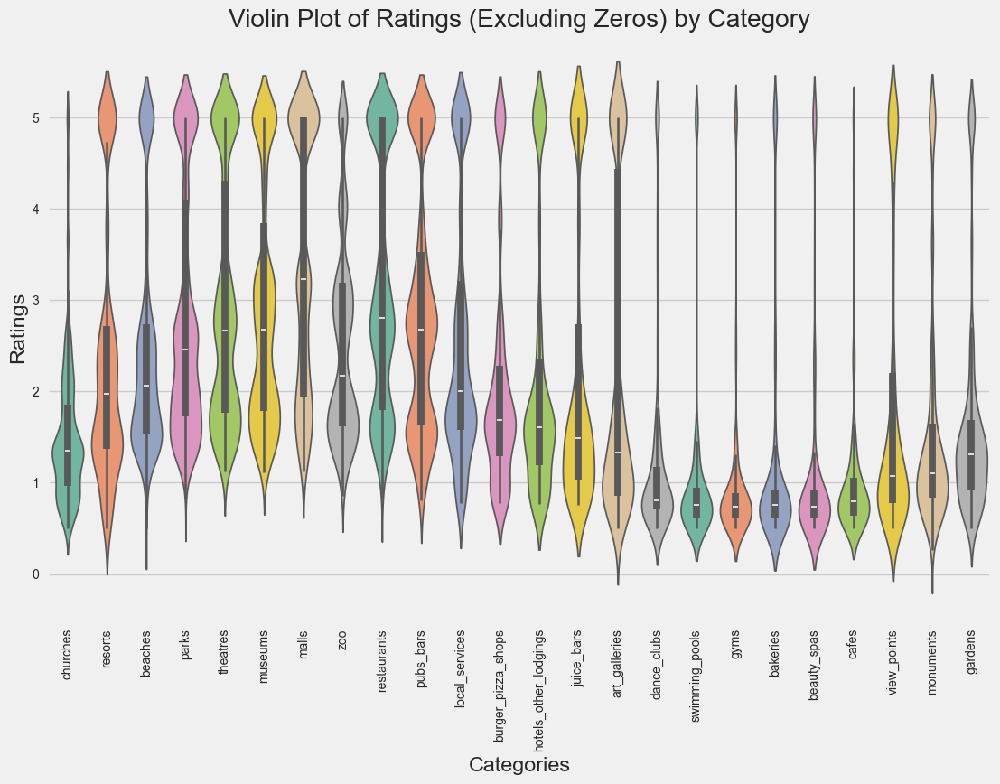

In [20]:
filtered_df = df[column_names].apply(lambda x: x[x != 0])

# Create a violin plot with categories on the x-axis and ratings on the y-axis
plt.figure(figsize=(12, 8))  # Adjust the size for readability
sns.violinplot(data=filtered_df, orient='v', palette='Set2')

# Labeling the plot
plt.xlabel('Categories')
plt.ylabel('Ratings')
plt.title('Violin Plot of Ratings (Excluding Zeros) by Category')

# Rotate x-axis labels vertically
plt.xticks(rotation=90)

# Show the plot
plt.show()

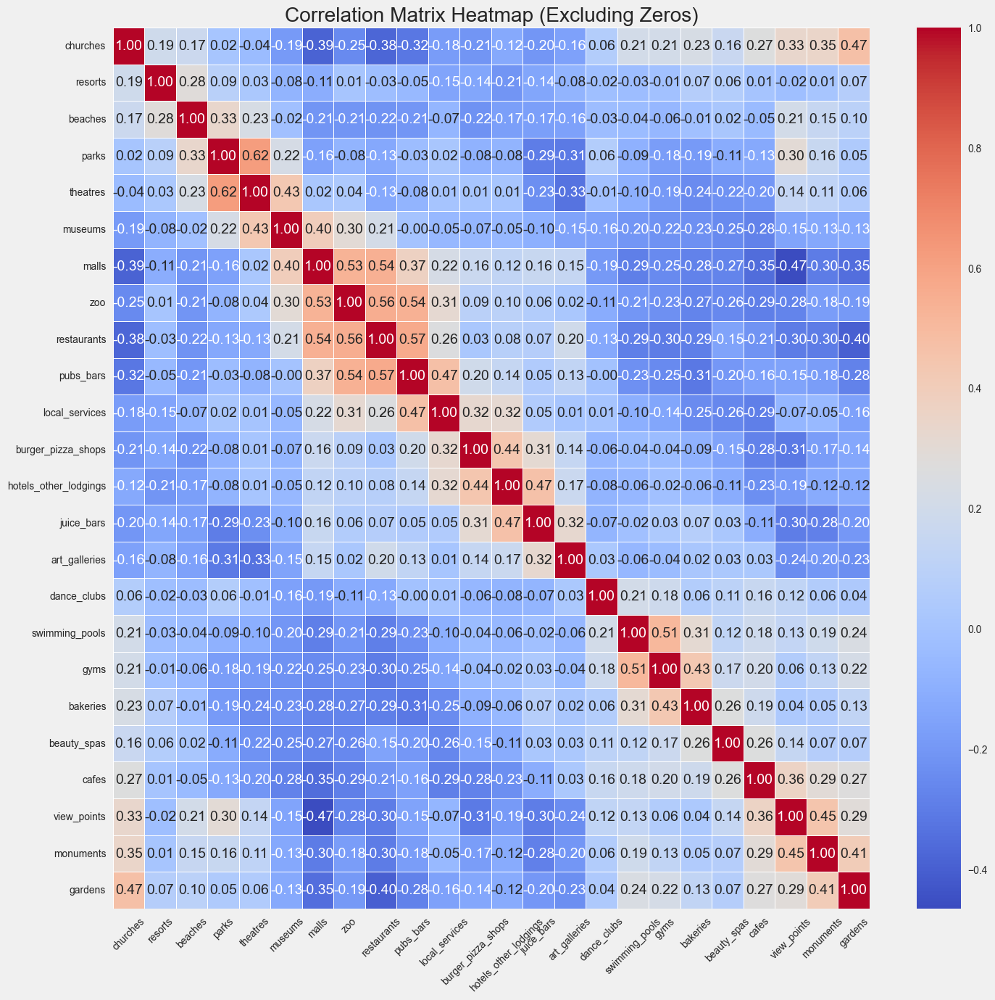

In [21]:
filtered_df = df[(df != 0).all(axis=1)]

# Step 2: Calculate the correlation matrix
corr_matrix = filtered_df.corr()

# Step 3: Create a heatmap to visualize the correlation matrix
plt.figure(figsize=(15, 15))  # Adjust the figure size for readability
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', cbar=True, linewidths=0.5)

# Customize the plot
plt.title('Correlation Matrix Heatmap (Excluding Zeros)')
plt.xticks(rotation=45)  # Rotate x-axis labels for readability (optional)
plt.yticks(rotation=0)   # Keep y-axis labels horizontal
plt.show()

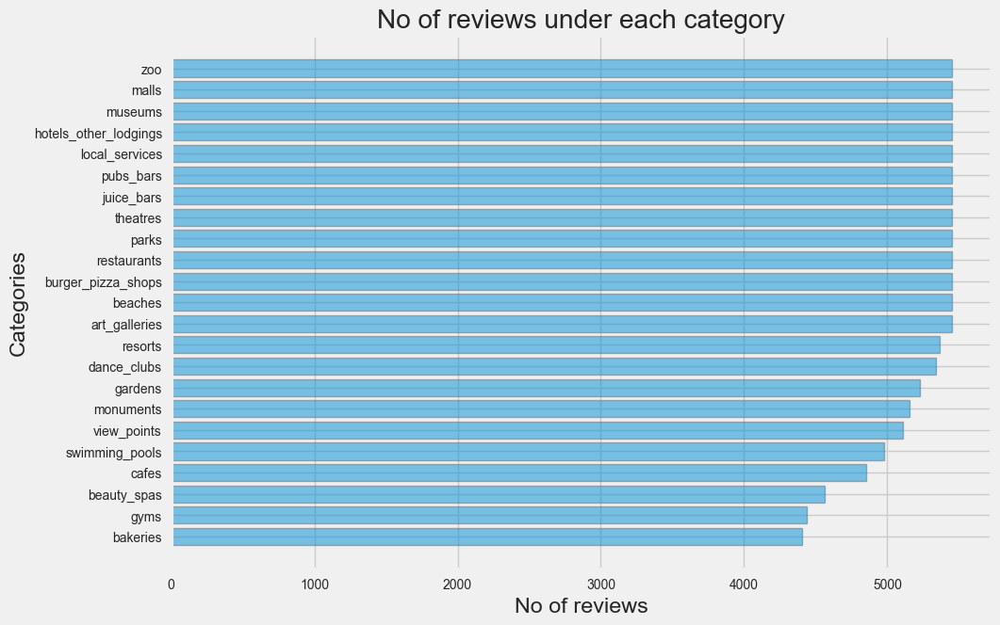

In [22]:
no_of_zeros = df[column_names[1:]].astype(bool).sum(axis=0).sort_values()

plt.figure(figsize=(10,7))
plt.barh(np.arange(len(column_names[1:])), no_of_zeros.values, align='center', alpha=0.5)
plt.yticks(np.arange(len(column_names[1:])), no_of_zeros.index)
plt.xlabel('No of reviews')
plt.ylabel('Categories')
plt.title('No of reviews under each category')
plt.show()

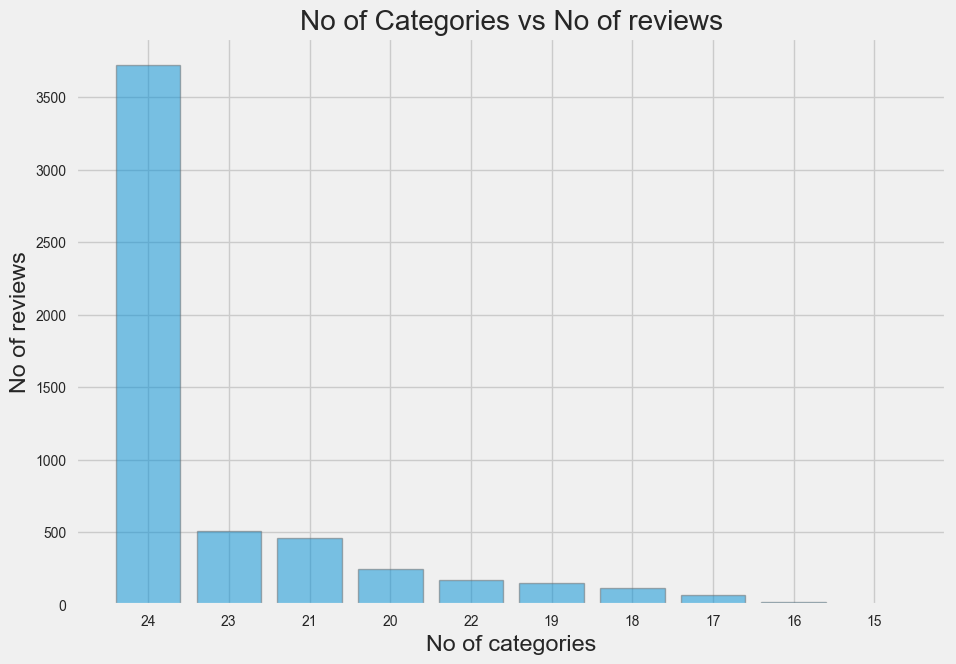

In [23]:
no_of_reviews = df[column_names[0:]].astype(bool).sum(axis=1).value_counts()

plt.figure(figsize=(10,7))
plt.bar(np.arange(len(no_of_reviews)), no_of_reviews.values, align='center', alpha=0.5)
plt.xticks(np.arange(len(no_of_reviews)), no_of_reviews.index)
plt.ylabel('No of reviews')
plt.xlabel('No of categories')
plt.title('No of Categories vs No of reviews')
plt.show()

In [24]:
avg_rating = df[column_names[0:]].mean()
avg_rating = avg_rating.sort_values()

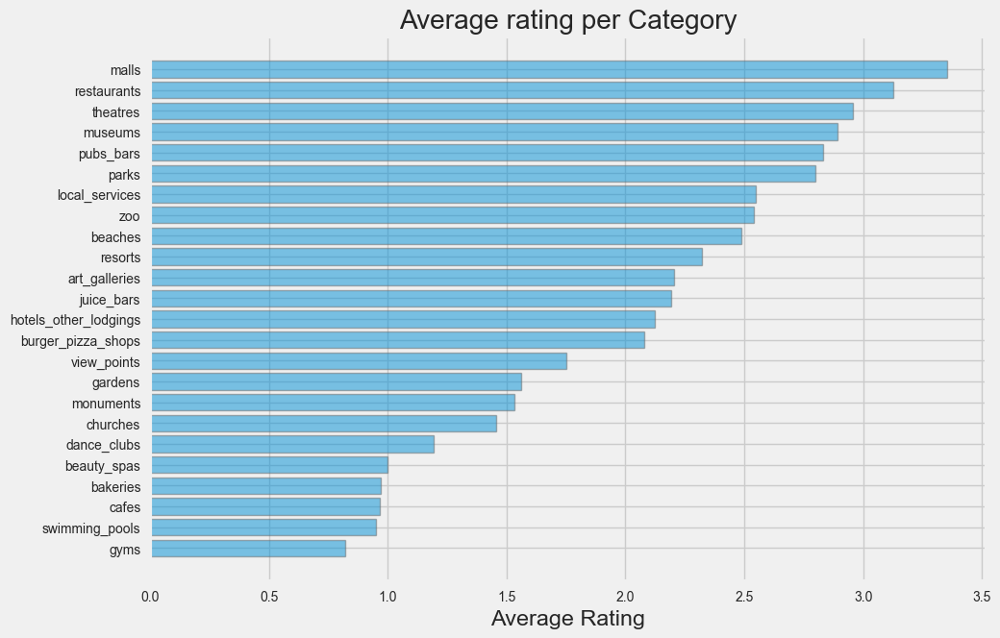

In [25]:
plt.figure(figsize=(10,7))
plt.barh(np.arange(len(column_names[0:])), avg_rating.values, align='center', alpha=0.5)
plt.yticks(np.arange(len(column_names[0:])), avg_rating.index)
plt.xlabel('Average Rating')
plt.title('Average rating per Category')
plt.show()

In [26]:
entertainment = ['theatres', 'dance_clubs', 'malls']
food_travel = ['restaurants', 'pubs_bars', 'burger_pizza_shops', 'juice_bars', 'bakeries', 'cafes']
places_of_stay = ['hotels_other_lodgings', 'resorts']
historical = ['churches', 'museums', 'art_galleries', 'monuments']
nature = ['beaches', 'parks', 'zoo', 'view_points', 'gardens']
services = ['local_services', 'swimming_pools', 'gyms', 'beauty_spas']

In [27]:
df_category = pd.DataFrame(columns = ['entertainment', 'food_travel', 'places_of_stay', 'historical', 'nature', 'services'])

In [28]:
df_category['entertainment'] = df[entertainment].mean(axis = 1) # average of all entertainment
df_category['food_travel'] = df[food_travel].mean(axis = 1)
df_category['places_of_stay'] = df[places_of_stay].mean(axis = 1)
df_category['historical'] = df[historical].mean(axis = 1)
df_category['nature'] = df[nature].mean(axis = 1)
df_category['services'] = df[services].mean(axis = 1)

In [29]:
df_category.describe()

#Entertainment has the highest average rating and Services have the lowest rating implying that people are more interested in entertainment

,entertainment,food_travel,places_of_stay,historical,nature,services
count,5453.000000,5453.000000,5453.000000,5453.000000,5453.000000,5453.000000
mean,2.500826,2.027232,2.222958,2.022007,2.227858,1.330423
std,0.722012,0.549363,0.886562,0.585001,0.662444,0.580707
min,1.120000,0.721667,0.730000,0.557500,0.576000,0.205000
25%,1.963333,1.650000,1.470000,1.647500,1.762000,0.937500
50%,2.453333,2.028333,1.885000,1.977500,2.160000,1.245000
75%,2.916667,2.433333,3.160000,2.392500,2.656000,1.685000
max,5.000000,3.873333,5.000000,4.322500,4.520000,3.937500


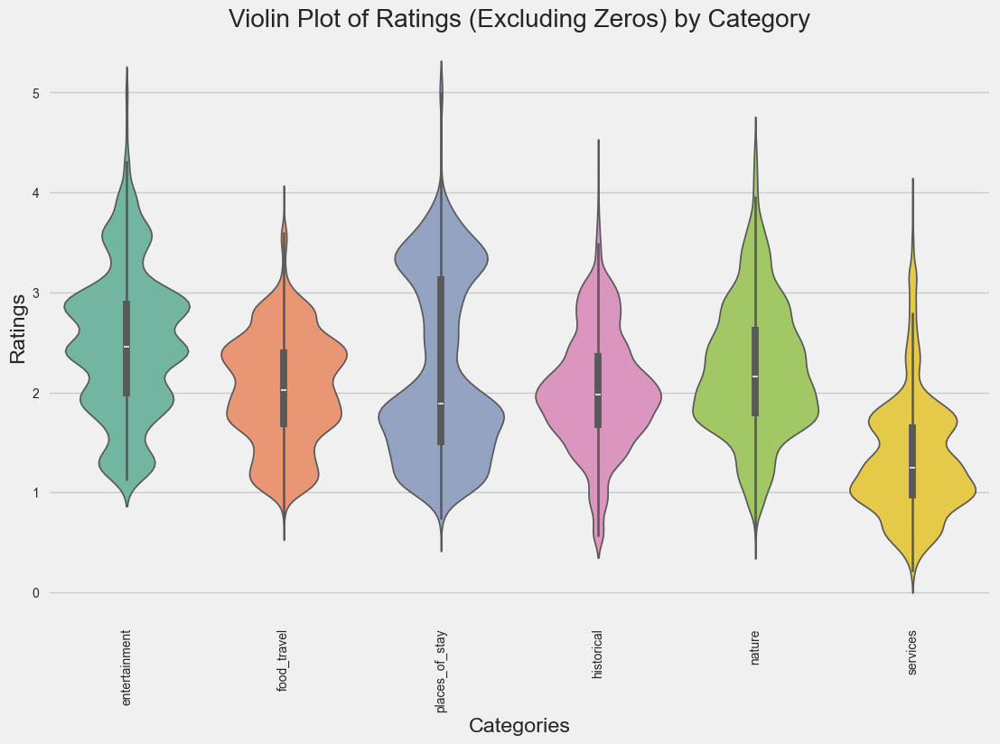

In [30]:
# Create a violin plot with categories on the x-axis and ratings on the y-axis
plt.figure(figsize=(12, 8))  # Adjust the size for readability
sns.violinplot(data=df_category, orient='v', palette='Set2')

# Labeling the plot
plt.xlabel('Categories')
plt.ylabel('Ratings')
plt.title('Violin Plot of Ratings (Excluding Zeros) by Category')

# Rotate x-axis labels vertically
plt.xticks(rotation=90)

# Show the plot
plt.show()

In [31]:
scaler = StandardScaler()
df_category_reviews = scaler.fit_transform(df_category)

# Convert the scaled data back to a DataFrame for easier handling
df_category_reviews = pd.DataFrame(df_category_reviews, columns=df_category.columns)
df_category_reviews.head()

,entertainment,food_travel,places_of_stay,historical,nature,services
0,1.425557,-0.996212,-1.548775,-1.465101,-0.455716,-1.344042
1,1.425557,-0.993178,-1.548775,-1.465101,-0.368153,-1.344042
2,1.425557,-0.996212,-1.548775,-1.465101,-0.374192,-1.344042
3,1.425557,-0.996212,-1.266760,-1.465101,-0.461755,-1.331126
4,1.425557,-0.993178,-1.554415,-1.465101,-0.377211,-1.339737


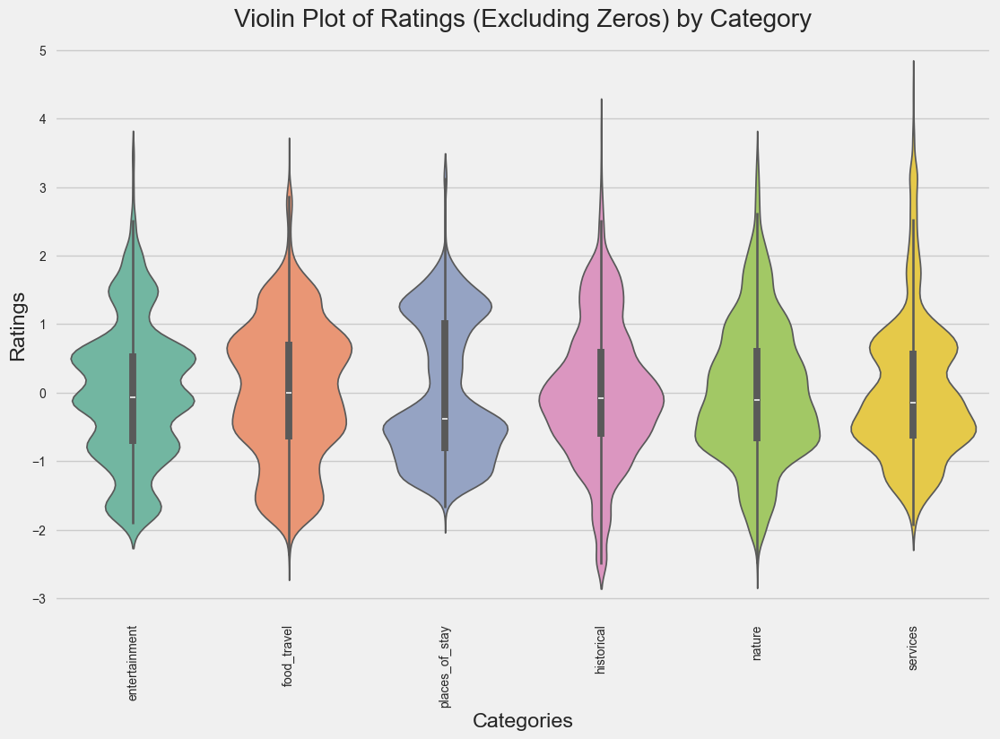

In [32]:
# Create a violin plot with categories on the x-axis and ratings on the y-axis
plt.figure(figsize=(12, 8))  # Adjust the size for readability
sns.violinplot(data=df_category_reviews, orient='v', palette='Set2')

# Labeling the plot
plt.xlabel('Categories')
plt.ylabel('Ratings')
plt.title('Violin Plot of Ratings (Excluding Zeros) by Category')

# Rotate x-axis labels vertically
plt.xticks(rotation=90)

# Show the plot
plt.show()

In [33]:
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster import hierarchy
from sklearn.cluster import AgglomerativeClustering
from scipy.spatial.distance import pdist
import plotly.graph_objects as go

Z = hierarchy.linkage(df_category_reviews, 'ward')

c, coph_dists = hierarchy.cophenet(Z, pdist(df_category_reviews, 'hamming'))

ward = c


A = hierarchy.linkage(df_category_reviews,'average')

c, coph_dists = hierarchy.cophenet(A, pdist(df_category_reviews, 'hamming'))

average = c


B = hierarchy.linkage(df_category_reviews,'single')

c, coph_dists = hierarchy.cophenet(B, pdist(df_category_reviews, 'hamming'))

single = c


C = hierarchy.linkage(df_category_reviews,'complete')

c, coph_dists = hierarchy.cophenet(C, pdist(df_category_reviews, 'hamming'))

complete = c


D = hierarchy.linkage(df_category_reviews,'weighted')

c, coph_dists = hierarchy.cophenet(D, pdist(df_category_reviews, 'hamming'))

weighted = c


E = hierarchy.linkage(df_category_reviews,'centroid')

c, coph_dists = hierarchy.cophenet(E, pdist(df_category_reviews, 'hamming'))

centroid = c

F = hierarchy.linkage(df_category_reviews,'median')

c, coph_dists = hierarchy.cophenet(F, pdist(df_category_reviews, 'hamming'))

median = c


metrics=['ward', 'average', 'single', 'complete', 'weighted', 'centroid', 'median']


fig = go.Figure([go.Bar(x=metrics, y=[ward, average, single, complete, weighted, centroid, median])])
fig.show()

In [34]:
from sklearn.metrics import silhouette_score
for n_clusters in range(2,10):
    clusterer = AgglomerativeClustering (n_clusters=n_clusters, distance_threshold = None)
    preds = clusterer.fit_predict(df_category_reviews)
    

    score = silhouette_score (df_category_reviews, preds)
    print ("For n_clusters = {}, silhouette score is {})".format(n_clusters, score))

For n_clusters = 2, silhouette score is 0.13122523571403938)
For n_clusters = 3, silhouette score is 0.12647625958800227)
For n_clusters = 4, silhouette score is 0.11551093134128587)
For n_clusters = 5, silhouette score is 0.11742018071511533)
For n_clusters = 6, silhouette score is 0.12745112705693082)
For n_clusters = 7, silhouette score is 0.1436079792125426)
For n_clusters = 8, silhouette score is 0.14045206844291666)
For n_clusters = 9, silhouette score is 0.148894716444761)


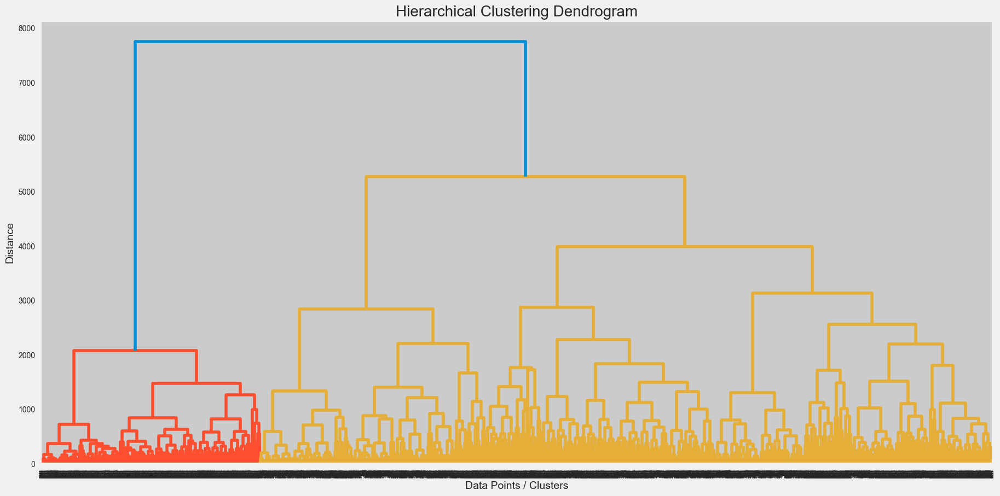

In [36]:
# Fit the AgglomerativeClustering model
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
model = model.fit(df_category_reviews)

# Create the linkage matrix from the model's children_
Z = hierarchy.linkage(model.children_, method='average')

# Create the figure and set size
plt.figure(figsize=(20, 10))

# Create the dendrogram with added improvements
dn = hierarchy.dendrogram(Z)

# Add title and labels to the plot
plt.title('Hierarchical Clustering Dendrogram', fontsize=20)
plt.xlabel('Data Points / Clusters', fontsize=14)
plt.ylabel('Distance', fontsize=14)

# Show the plot
plt.show()

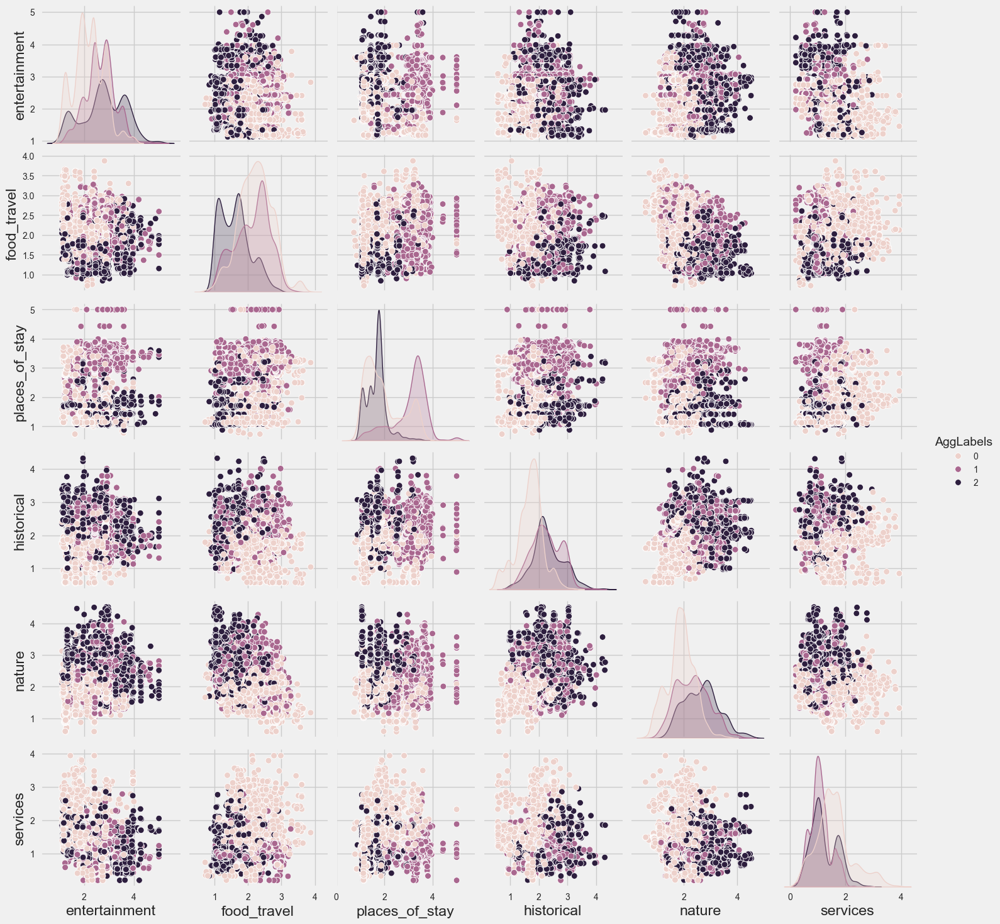

In [37]:


model = AgglomerativeClustering(distance_threshold=None, n_clusters = 3)
model = model.fit(df_category_reviews)
y_agg=model.fit_predict(df_category_reviews)

df_agg = df_category.copy()
df_agg["AggLabels"] = y_agg

#uncomment the following line and let your machine explode!
sns.pairplot( df_agg, hue="AggLabels") 

df_agg["AggLabels"].value_counts(0)

plt.show() 

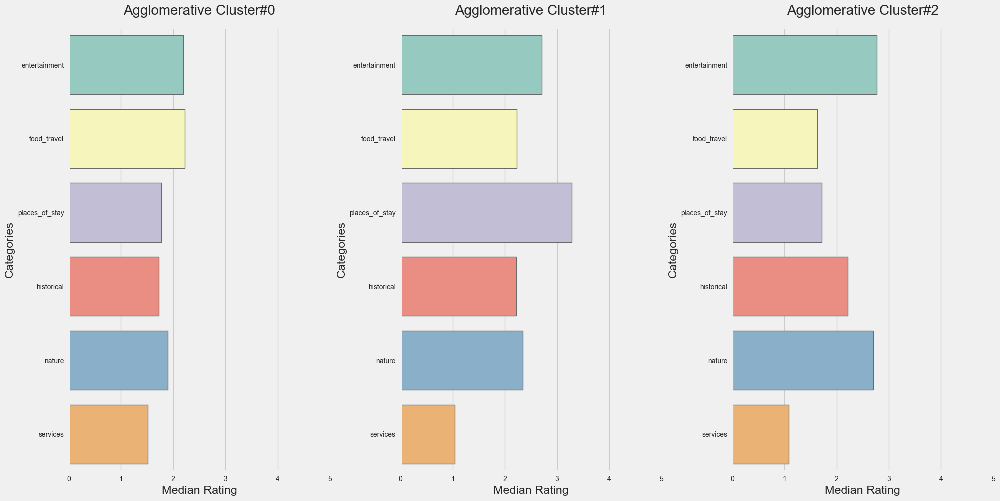

In [54]:
df1 = df_category.copy()
df1['cluster'] = model.labels_
df_long = pd.melt(df1, "cluster", var_name="categories")

fig = plt.figure(figsize = (20,10))
for i in range(len(df_long.cluster.unique())):
    plt.subplot(1,len(df_long.cluster.unique()),i+1)
    g = sns.barplot(y='categories',x='value',data=df_long[df_long['cluster']==i],palette='Set3',ci=None,estimator=np.median)
#     g.set_xticklabels(g.get_xticklabels(),rotation=90);
    g.set_title(f'Agglomerative Cluster#{i}',y=1.02,fontsize=20)
#     g.set_xlabel("")
    g.set_ylabel('Categories')
    g.set_xlabel('Median Rating')
    g.set_xlim(0,5)
fig.tight_layout(pad=0.5)
plt.savefig
plt.show()

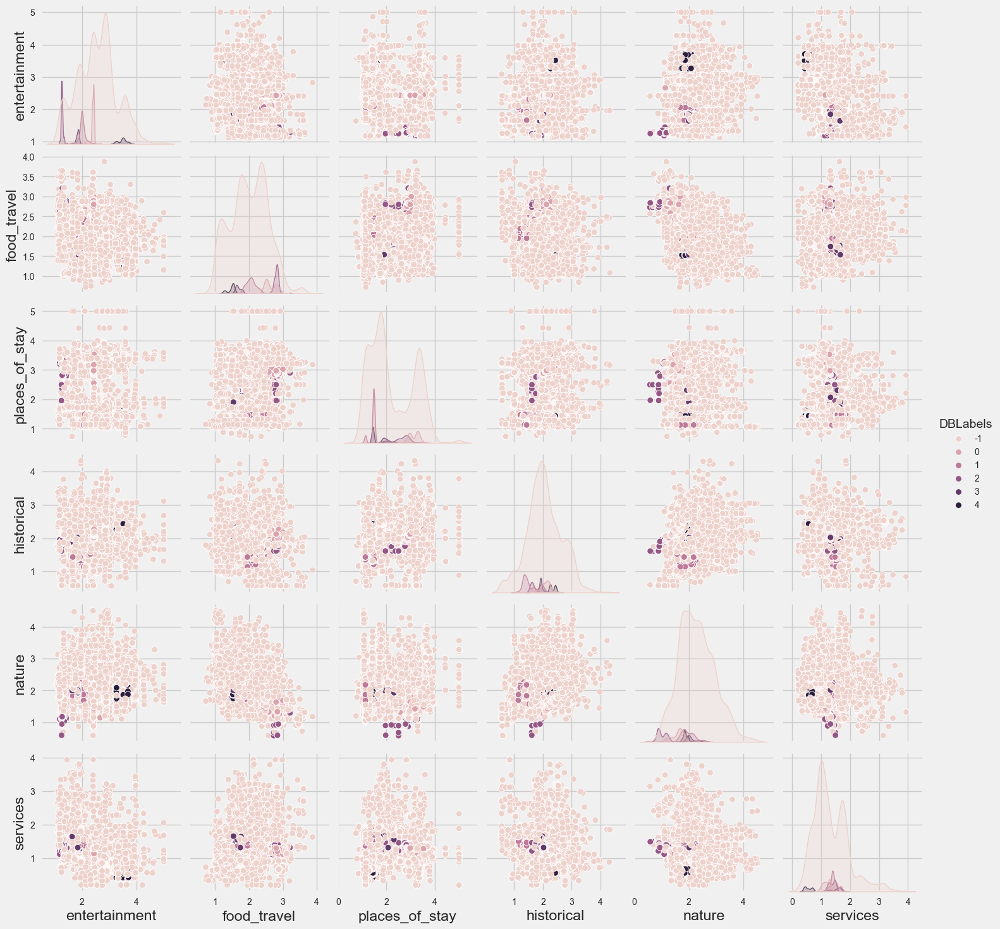

In [39]:
from sklearn.cluster import DBSCAN

model2 = DBSCAN(eps = 0.6, min_samples = 43)

model2 = model2.fit(df_category_reviews)

np.unique(model2.labels_)

y_db=model2.labels_

df_db = df_category.copy()
df_db["DBLabels"] = y_db

df_db["DBLabels"].value_counts(0)


sns.pairplot( df_db, hue="DBLabels")  
plt.show()

In [40]:
# Get names of indexes for which column DB_Labels has value -1
indexNames = df_db[ df_db['DBLabels'] == -1 ].index
# Delete these row indexes from dataFrame
df_db.drop(indexNames , inplace=True)

df_db['DBLabels'].unique()

array([1, 0, 2, 3, 4])

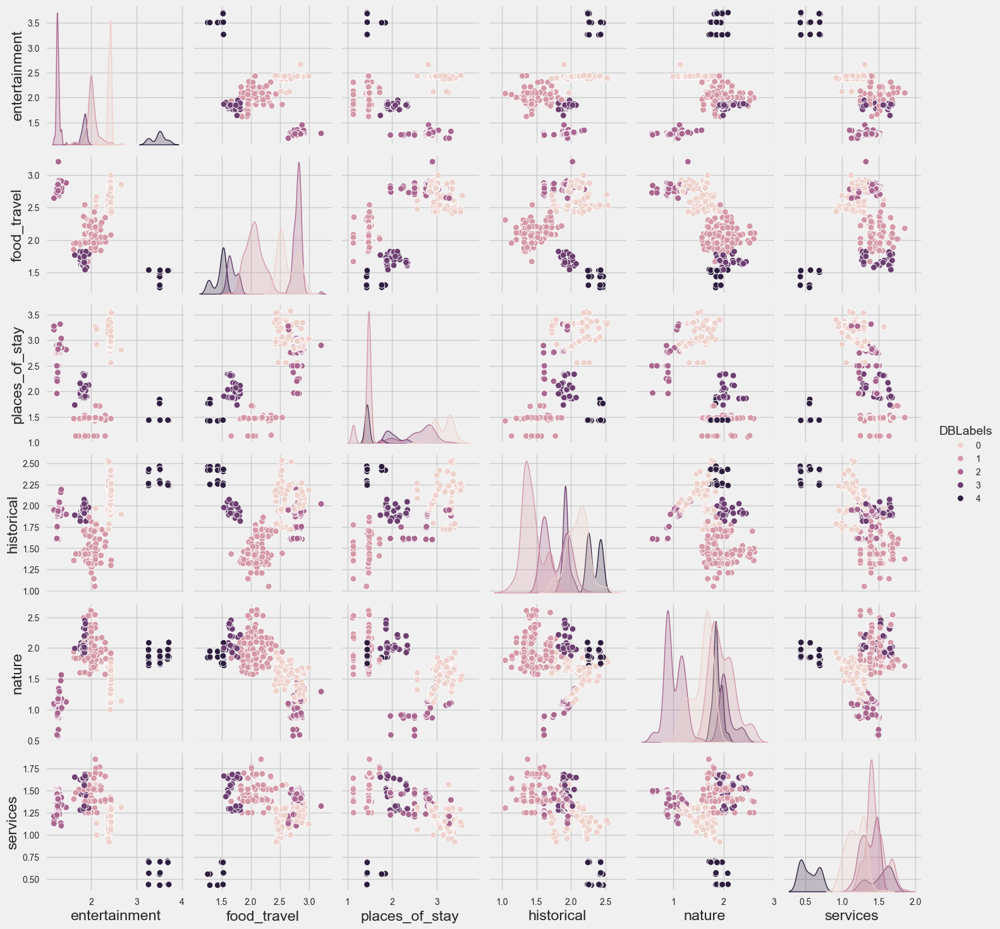

In [41]:
sns.pairplot( df_db, hue="DBLabels")
plt.show()

In [42]:
y_db = df_db['DBLabels']
silhouette_score (df_db, y_db)

np.float64(0.7736111417475002)

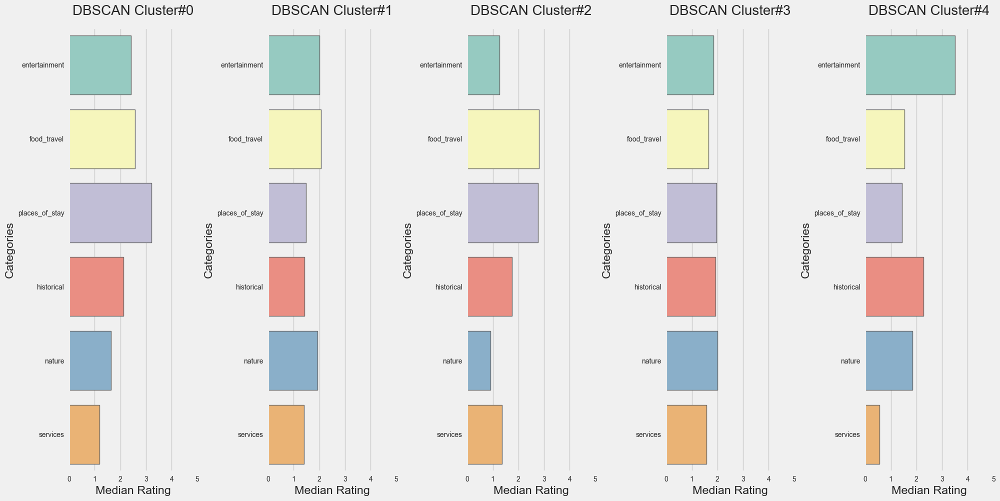

In [53]:
# Convert the dataframe to long format
df_long = pd.melt(df_db, id_vars=["DBLabels"], var_name="categories")

# Set up the plotting figure
fig = plt.figure(figsize=(20, 10))

# Loop through each unique cluster to plot its distribution
for i in range(len(df_long['DBLabels'].unique())):
    plt.subplot(1, len(df_long['DBLabels'].unique()), i + 1)
    
    # Create a barplot for each cluster
    g = sns.barplot(y='categories', x='value', data=df_long[df_long['DBLabels'] == i], palette='Set3', ci=None, estimator=np.median)
    
    # Set title and labels for each subplot
    g.set_title(f'DBSCAN Cluster#{i}', y=1.02, fontsize=20)
    g.set_ylabel('Categories')
    g.set_xlabel('Median Rating')
    g.set_xlim(0, 5)

# Adjust the layout and show the plot
fig.tight_layout(pad=0.5)
plt.show()  # This is required to display the plot

In [56]:
for n_clusters in range(2,10):
    clusterer = KMeans(n_clusters = n_clusters)
    preds = clusterer.fit_predict(df_category_reviews)
    

    score = silhouette_score (df_category_reviews, preds)
    print ("For n_clusters = {}, silhouette score is {})".format(n_clusters, score))

For n_clusters = 2, silhouette score is 0.17740266549355016)
For n_clusters = 3, silhouette score is 0.17767390721027776)
For n_clusters = 4, silhouette score is 0.1694237597915021)
For n_clusters = 5, silhouette score is 0.17998161628607406)
For n_clusters = 6, silhouette score is 0.16281860274919)
For n_clusters = 7, silhouette score is 0.1881657565675918)
For n_clusters = 8, silhouette score is 0.18460058291424286)
For n_clusters = 9, silhouette score is 0.18749547507788203)


1 : 32717.999999999996
2 : 26351.023037061612
3 : 22884.635514102058
4 : 20620.23683097306
5 : 18686.21782632651
6 : 17148.372246286206
7 : 16057.774352015038
8 : 15775.50814976519
9 : 14505.592926757548


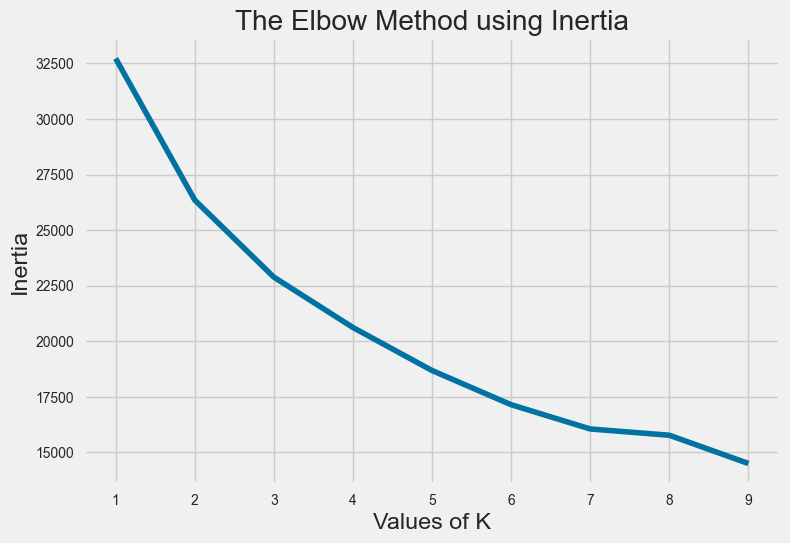

In [64]:
from scipy.spatial.distance import cdist
distortions = [] 
inertias = [] 
mapping2 = {} 
K = range(1, 10) 
  
for k in K: 
    # Building and fitting the model 
    kmeanModel = KMeans(n_clusters=k, random_state=42).fit(df_category_reviews) 
      
    distortions.append(sum(np.min(cdist(df_category_reviews, kmeanModel.cluster_centers_, 
                      'euclidean'), axis=1)) / df_category_reviews.shape[0]) 
    inertias.append(kmeanModel.inertia_) 
    mapping2[k] = kmeanModel.inertia_ 
    
for key, val in mapping2.items(): 
    print(f"{key} : {val}")
    
plt.plot(K, inertias, 'bx-') 
plt.xlabel('Values of K') 
plt.ylabel('Inertia') 
plt.title('The Elbow Method using Inertia') 
plt.show()


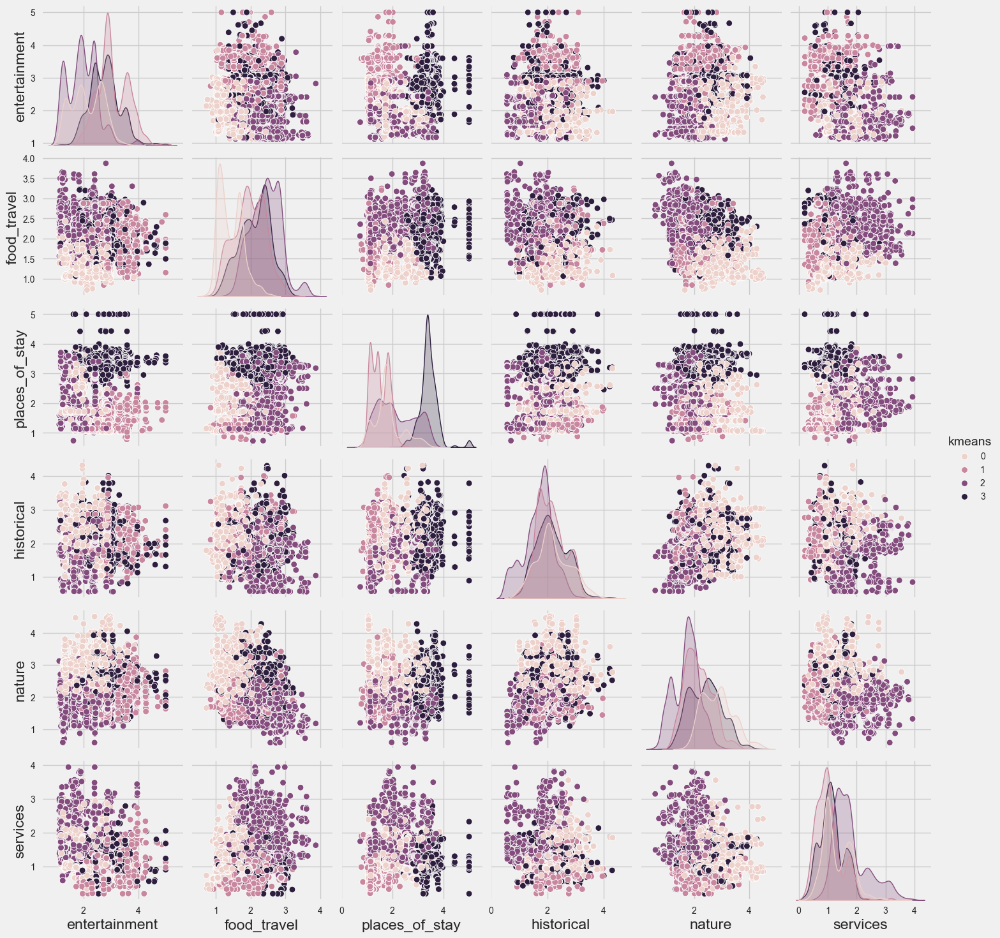

In [66]:
model4 = KMeans(n_clusters = 4, n_init = 40)

model4 = model4.fit(df_category_reviews)

df_kmeans = df_category.copy()

df_kmeans['kmeans'] = model4.fit_predict(df_category_reviews)

sns.pairplot( df_kmeans, hue = 'kmeans')

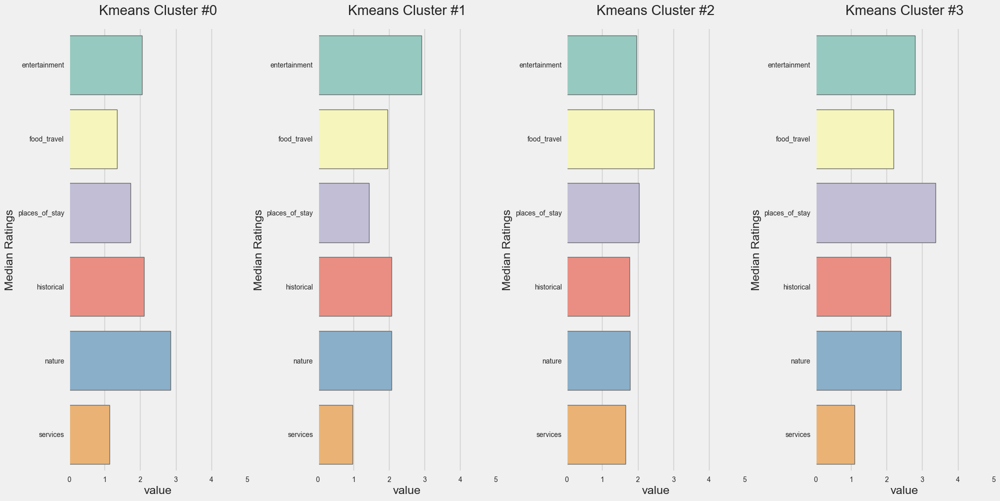

In [68]:
# Convert the dataframe to long format
df_long = pd.melt(df_kmeans, id_vars=["kmeans"], var_name="categories")

# Set up the plotting figure
fig = plt.figure(figsize=(20, 10))

# Loop through each unique cluster to plot its distribution
for i in range(len(df_long['kmeans'].unique())):
    plt.subplot(1, len(df_long['kmeans'].unique()), i + 1)
    
    # Create a barplot for each cluster
    g = sns.barplot(y='categories', x='value', data=df_long[df_long['kmeans'] == i], palette='Set3', ci=None, estimator=np.median)
    
    # Set title and labels for each subplot
    g.set_title(f'Kmeans Cluster #{i}', y=1.02, fontsize=20)
    g.set_ylabel('Categories')
    g.set_ylabel('Median Ratings')
    g.set_xlim(0, 5)

# Adjust the layout and show the plot
fig.tight_layout(pad=0.5)
plt.show()  # This is required to display the plot

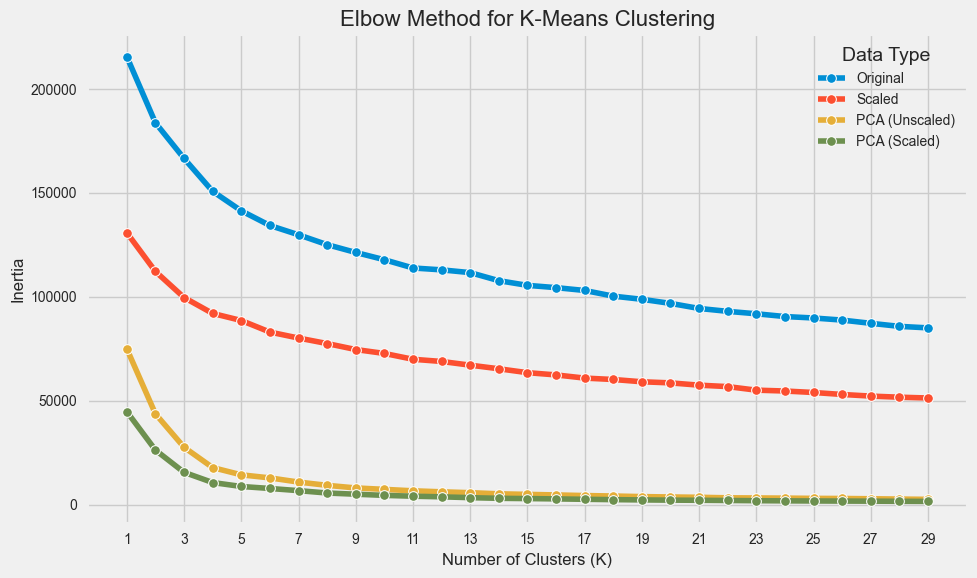

In [69]:
# Assuming df is already loaded
df_original = df.copy()

# Scaled Data
df_scaled = StandardScaler().fit_transform(df_original)

# PCA without scaling
pca = PCA(n_components=2, random_state=42)
df_PCA = pca.fit_transform(df_original)

# PCA with scaling
df_PCA_scaled = pca.fit_transform(df_scaled)

# List of data for clustering
data_list = [df_original, df_scaled, df_PCA, df_PCA_scaled]
inertia_list = []
list_k = list(range(1, 30))

# Run KMeans and compute inertia for different K values
for i in range(len(data_list)):
    sse = []
    data = data_list[i]
    for k in list_k:
        km = KMeans(n_clusters=k, random_state=42)
        km.fit(data)
        sse.append(km.inertia_)
    inertia_list.append(sse)

# Prepare data for plotting
result_ori = pd.DataFrame({'K': list_k, 'Inertia': inertia_list[0], 'data_type': 'Original'})
result_ori_scaled = pd.DataFrame({'K': list_k, 'Inertia': inertia_list[1], 'data_type': 'Scaled'})
result_PCA = pd.DataFrame({'K': list_k, 'Inertia': inertia_list[2], 'data_type': 'PCA (Unscaled)'})
result_PCA_scaled = pd.DataFrame({'K': list_k, 'Inertia': inertia_list[3], 'data_type': 'PCA (Scaled)'})

# Combine all the results into a single DataFrame
result = pd.concat([result_ori, result_ori_scaled, result_PCA, result_PCA_scaled])

# Plotting Inertia vs K for all cases
plt.figure(figsize=(10, 6))

sns.lineplot(data=result, x='K', y='Inertia', hue='data_type', marker='o')

plt.title('Elbow Method for K-Means Clustering', fontsize=16)
plt.xlabel('Number of Clusters (K)', fontsize=12)
plt.ylabel('Inertia', fontsize=12)
plt.legend(title='Data Type')
plt.xticks(range(1, 31, 2))  # Show every second number for x-axis ticks
plt.grid(True)
plt.tight_layout()
plt.show()

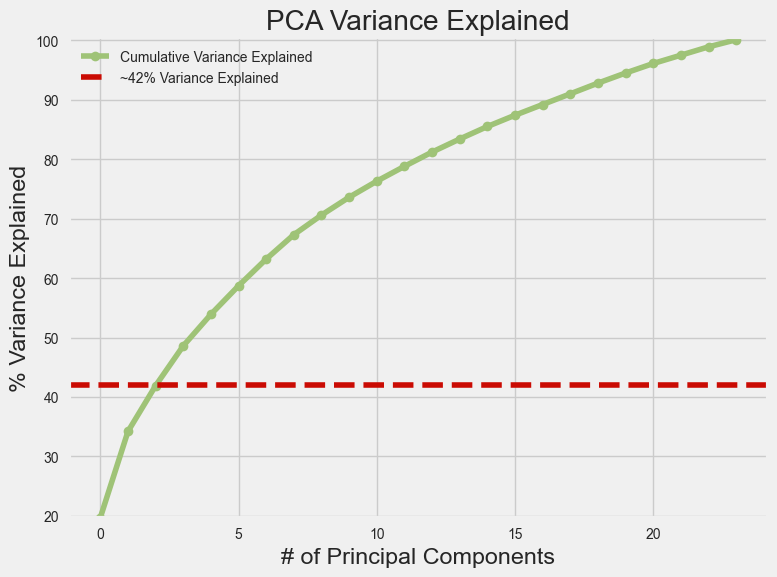

In [70]:


# Assuming df is already loaded
# Scale the data
df_scaled = StandardScaler().fit_transform(df)

# Apply PCA with 2 components
pca = PCA(n_components=24, random_state=42)
df_PCA_scaled = pca.fit_transform(df_scaled)

# Calculate variance explained
variance = pca.explained_variance_ratio_  # Variance ratios for each component
var = np.cumsum(np.round(variance, decimals=3) * 100)  # Cumulative variance explained (in percentage)

# Plotting the variance explained by PCA
fig, ax = plt.subplots(figsize=(8, 6))

ax.plot(var, marker='o', linestyle='-', color='g', label='Cumulative Variance Explained')
ax.axhline(y=42, color='r', linestyle='--', label='~42% Variance Explained')  # Threshold line at 80%

ax.set_xlabel('# of Principal Components')
ax.set_ylabel('% Variance Explained')
ax.set_title('PCA Variance Explained')
ax.set_ylim(min(var), 100.5)  # Set the y-axis from min variance to 100%

ax.legend(loc='best')

# Show the plot
plt.tight_layout()
plt.show()


In [71]:
pca = PCA(n_components = 2,random_state=42)
df_PCA_scaled = pca.fit_transform(df_scaled)

model = KMeans(n_clusters=3,random_state=42)
model.fit(df_PCA_scaled)
cluster = model.labels_

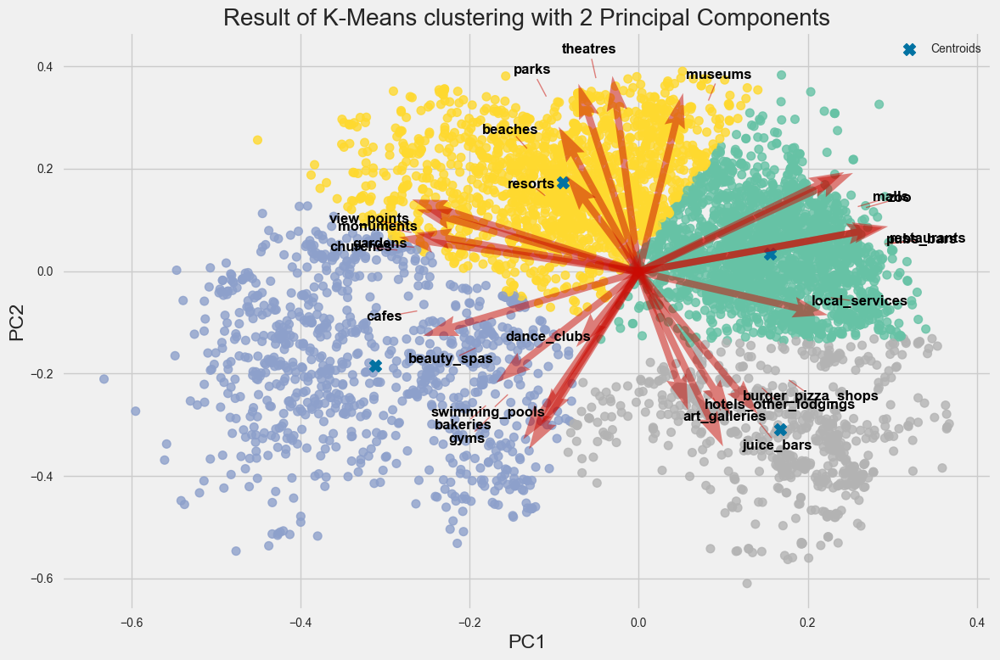

Silhouette Score: 0.44176534157658365


In [102]:
from sklearn.metrics import silhouette_score

# Apply PCA with 2 components
pca = PCA(n_components=2, random_state=42)
df_PCA_scaled = pca.fit_transform(df_scaled)

# KMeans clustering with 6 clusters on PCA-transformed data
model = KMeans(n_clusters=4, random_state=42)
model.fit(df_PCA_scaled)
cluster = model.labels_

# Calculate the coefficients (EigenVectors)
coeff = np.transpose(pca.components_[:2, :])  # Now including only the 2 components
n = coeff.shape[0]
labels = list(df.columns)

# Extract the first and second principal components
xs = df_PCA_scaled[:, 0]
ys = df_PCA_scaled[:, 1]

# Scaling factors for better visualization
scalex = 1.0 / (xs.max() - xs.min())
scaley = 1.0 / (ys.max() - ys.min())

# 2D plot setup
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111)

# Scatter plot of each data point
g = ax.scatter(xs * scalex, ys * scaley, c=cluster, cmap='Set2', alpha=0.8)

# Add cluster centroids
ax.scatter(model.cluster_centers_[:, 0] * scalex,
           model.cluster_centers_[:, 1] * scaley,
           color='b', s=100, marker='X', label="Centroids")

# Add EigenVectors (arrows representing PCA components)
for i in range(n):
    ax.quiver(0, 0, coeff[i, 0], coeff[i, 1], color='r', alpha=0.5, scale=1, scale_units='xy')
    
    # Add lines pointing to the features
    ax.plot([coeff[i, 0], coeff[i, 0] * 1.1], [coeff[i, 1], coeff[i, 1] * 1.1], color='r', lw=1, alpha=0.5)
    
    # Add feature labels with improved color
    ax.text(coeff[i, 0] * 1.15, coeff[i, 1] * 1.15, labels[i], color='black', ha='center', va='center', fontsize=12, weight='bold')

# Set labels and title
ax.set_xlabel(f"PC{1}")
ax.set_ylabel(f"PC{2}")
ax.set_title('Result of K-Means clustering with 2 Principal Components', fontsize=20)

# Show legend
ax.legend()

# Display the plot
plt.tight_layout()
plt.show()

# Calculate the silhouette score for the clustering
sil_score = silhouette_score(df_PCA_scaled, cluster)
print(f"Silhouette Score: {sil_score}")


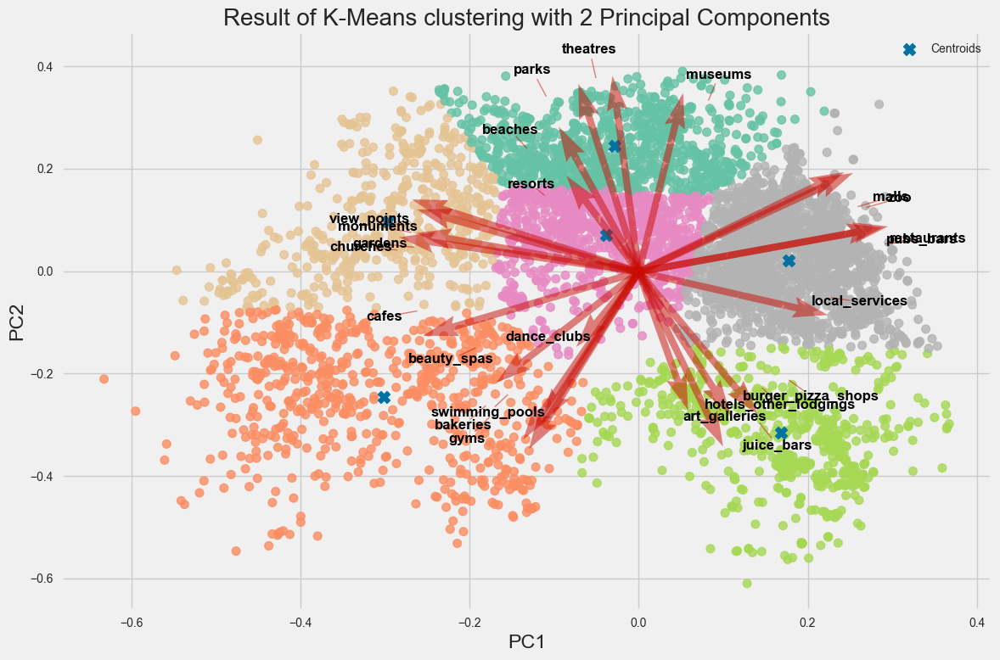

Silhouette Score: 0.3858335560650772


<Figure size 800x550 with 0 Axes>

In [ ]:
from sklearn.metrics import silhouette_score

# Apply PCA with 2 components
pca = PCA(n_components=2, random_state=42)
df_PCA_scaled = pca.fit_transform(df_scaled)

# KMeans clustering with 6 clusters on PCA-transformed data
model = KMeans(n_clusters=6, random_state=42)
model.fit(df_PCA_scaled)
cluster = model.labels_

# Calculate the coefficients (EigenVectors)
coeff = np.transpose(pca.components_[:2, :])  # Now including only the 2 components
n = coeff.shape[0]
labels = list(df.columns)

# Extract the first and second principal components
xs = df_PCA_scaled[:, 0]
ys = df_PCA_scaled[:, 1]

# Scaling factors for better visualization
scalex = 1.0 / (xs.max() - xs.min())
scaley = 1.0 / (ys.max() - ys.min())

# 2D plot setup
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111)

# Scatter plot of each data point
g = ax.scatter(xs * scalex, ys * scaley, c=cluster, cmap='Set2', alpha=0.8)

# Add cluster centroids
ax.scatter(model.cluster_centers_[:, 0] * scalex,
           model.cluster_centers_[:, 1] * scaley,
           color='b', s=100, marker='X', label="Centroids")

# Add EigenVectors (arrows representing PCA components)
for i in range(n):
    ax.quiver(0, 0, coeff[i, 0], coeff[i, 1], color='r', alpha=0.5, scale=1, scale_units='xy')
    
    # Add lines pointing to the features
    ax.plot([coeff[i, 0], coeff[i, 0] * 1.1], [coeff[i, 1], coeff[i, 1] * 1.1], color='r', lw=1, alpha=0.5)
    
    # Add feature labels with improved color
    ax.text(coeff[i, 0] * 1.15, coeff[i, 1] * 1.15, labels[i], color='black', ha='center', va='center', fontsize=12, weight='bold')

# Set labels and title
ax.set_xlabel(f"PC{1}")
ax.set_ylabel(f"PC{2}")
ax.set_title('Result of K-Means clustering with 2 Principal Components', fontsize=20)

# Show legend
ax.legend()

# Display the plot
plt.tight_layout()
plt.show()

# Calculate the silhouette score for the clustering
sil_score = silhouette_score(df_PCA_scaled, cluster)
print(f"Silhouette Score: {sil_score}")


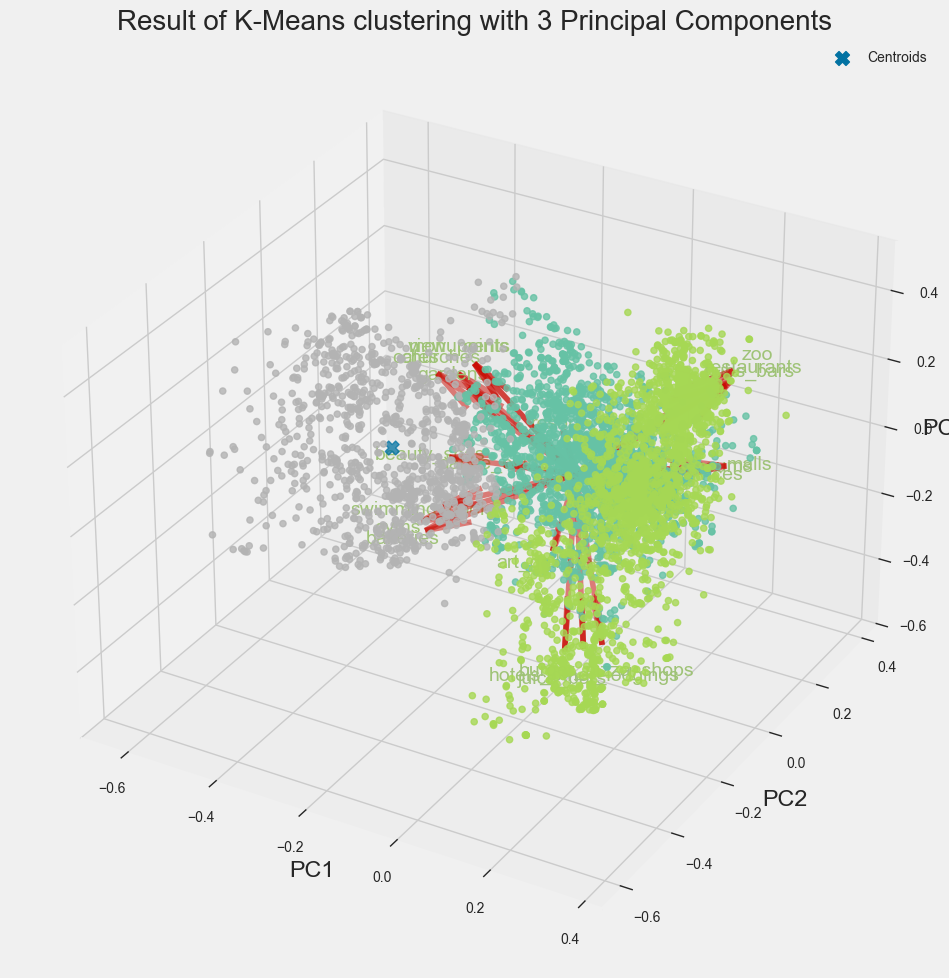

Silhouette Score: 0.36371138373200096


<Figure size 800x550 with 0 Axes>

In [ ]:
from sklearn.metrics import silhouette_score

# Apply PCA with 3 components
pca = PCA(n_components=3, random_state=42)
df_PCA_scaled = pca.fit_transform(df_scaled)

# KMeans clustering with 3 clusters on PCA-transformed data
model = KMeans(n_clusters=3, random_state=42)
model.fit(df_PCA_scaled)
cluster = model.labels_

# Calculate the coefficients (EigenVectors)
coeff = np.transpose(pca.components_[:3, :])  # Now including the 3 components
n = coeff.shape[0]
labels = list(df.columns)

# Extract the first, second, and third principal components
xs = df_PCA_scaled[:, 0]
ys = df_PCA_scaled[:, 1]
zs = df_PCA_scaled[:, 2]

# Scaling factors for better visualization
scalex = 1.0 / (xs.max() - xs.min())
scaley = 1.0 / (ys.max() - ys.min())
scalez = 1.0 / (zs.max() - zs.min())

# 3D plot setup
fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot of each data point
g = ax.scatter(xs * scalex, ys * scaley, zs * scalez, c=cluster, cmap='Set2', alpha=0.8)

# Add cluster centroids
ax.scatter(model.cluster_centers_[:, 0] * scalex,
           model.cluster_centers_[:, 1] * scaley,
           model.cluster_centers_[:, 2] * scalez,
           color='b', s=100, marker='X', label="Centroids")

# Add EigenVectors (arrows representing PCA components)
for i in range(n):
    ax.quiver(0, 0, 0, coeff[i, 0], coeff[i, 1], coeff[i, 2], color='r', alpha=0.5)
    ax.text(coeff[i, 0] * 1.15, coeff[i, 1] * 1.15, coeff[i, 2] * 1.15, labels[i], color='g', ha='center', va='center')

# Set labels and title
ax.set_xlabel(f"PC{1}")
ax.set_ylabel(f"PC{2}")
ax.set_zlabel(f"PC{3}")
ax.set_title('Result of K-Means clustering with 3 Principal Components', fontsize=20)

# Show legend
ax.legend()

# Display the plot
plt.tight_layout()
plt.show()

# Calculate the silhouette score for the clustering
sil_score = silhouette_score(df_PCA_scaled, cluster)
print(f"Silhouette Score: {sil_score}")


In [100]:
pca = PCA(n_components=8, random_state=42)
df_PCA_scaled = pca.fit_transform(df_scaled)

# KMeans clustering with 3 clusters on PCA-transformed data
model = KMeans(n_clusters=4, random_state=42)
model.fit(df_PCA_scaled)
cluster = model.labels_

# Calculate the silhouette score for the clustering
sil_score = silhouette_score(df_PCA_scaled, cluster)
print(f"Silhouette Score for 8 PCA components: {sil_score}")

Silhouette Score for 8 PCA components: 0.23076540607986695


In [ ]:
# PCA for variance explained plot
pca = PCA()
pca.fit(df_scaled)
pca_samples = pca.transform(df_scaled)

# Create the plot for explained variance
fig, ax = plt.subplots(figsize=(14, 5))

# Step plot for cumulative explained variance
plt.step(range(1, df_scaled.shape[1] + 1), pca.explained_variance_ratio_.cumsum(), where='mid',
         label='Cumulative explained variance')

# Bar plot for individual explained variance
sns.barplot(x=np.arange(1, df_scaled.shape[1] + 1), y=pca.explained_variance_ratio_, alpha=0.5, color='g',
            label='Individual explained variance')

# Set the x-axis limit based on the number of features (adjust if needed)
plt.xlim(0, df_scaled.shape[1])

# Customize x-axis labels (hide odd-indexed labels)
ax.set_xticklabels([s if int(s.get_text()) % 2 == 0 else '' for s in ax.get_xticklabels()])

# Set labels and legend
plt.ylabel('Explained Variance', fontsize=14)
plt.xlabel('Principal Components', fontsize=14)
plt.legend(loc='upper left', fontsize=13)

# Show the plot
plt.show()